Author: Andreas Traut  
Date: 13.08.2020  

## Introduction

In this Jupyter notebook I use the "fast.ai" open source library. "Fast.ai" is based on "PyTorch" and is intended to simplify work with deep learning, including by standardizing common deep learning concepts. In addition to the documentation (https://docs.fast.ai/) and a forum (https://forums.fast.ai/) there are also courses (https://course.fast.ai/ and also on Youtube https://www.youtube.com/playlist?list=PLfYUBJiXbdtSIJb-Qd3pw0cqCbkGeS0xn).

"PyTorch" (on which "fast.ai" is based) was developed by the "Facebook research team for artificial intelligence" and is freely available as open source. It is currently one of the most interesting alternatives to "Tensorflow", which was developed by the Google Brain team (also open source). There are numerous articles and discussions around these two "champions" PyTorch and Tensorflow. For example, here (https://deepsense.ai/keras-or-pytorch/) 43,000 machine learning articles were evaluated and it emerged that Tensorflow was mentioned in 14% of the articles, just under 5% Pytorch, then below 4% others. So Tensorflow is "market leader", but Pytorch's growth rates have risen sharply since 2018.

I also looked at the forums of "fast.ai" and had conversations there (see https://forums.fast.ai/t/fastai2-and-course-2020-important-notice/75684/16): I would describe "fast.ai" as a project that is carried out with a lot of passion by some developers, but which will probably never have the continuity and application security (e.g. in the event of release changes) as other projects (e.g. Tensorflow or PyTorch). I have noticed that a release change with "fast.ai" leads to incompatibilities of the notebooks, which means that all older notebooks have to be re-prepared with every release change. The present one is based on fastai-1.0.61. As soon as the new release fastai-2 comes out (probably at the end of 2020) this notebook will probably no longer work. 

It's a shame, but this approach from "fast.ai" seems to me to be more of a "playground" and not a serious project with which one does important calculations for the production of companies. I have found that extensive research in forums is useful and important in order to make decisions for or against a library (such as "fast.ai"). In this case I tend rather against the use of "fast.ai" for the application in the production of a company for the reasons mentioned above.

## Boiler Plate

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

## Importing libaries

In [7]:
from fastai import *

In [8]:
import pandas as pd
import pickle
import numpy as np
#from fastai.vision import *
#from fastai.callbacks.hooks import *
import matplotlib.pyplot as plt
from lshashpy3 import LSHash
from PIL import Image
import tqdm #from tqdm import tqdm_notebook
pd.set_option('display.max_columns', 500)
import warnings; warnings.simplefilter('ignore')

ModuleNotFoundError: No module named 'lshashpy3'

In [ ]:
path = Path('../data/caltechown/')

## Loading Data and Model

In [4]:
tfms = get_transforms(
    do_flip=False, 
    flip_vert=False, 
    max_rotate=0, 
    max_lighting=0, 
    max_zoom=1, 
    max_warp=0
)
data = (ImageList.from_folder(path)
        .split_by_rand_pct(0.2)
        .label_from_folder()
        .transform(tfms=tfms, size=224)
        .databunch(bs=64))

NameError: name 'get_transforms' is not defined

In [56]:
print('Number of classes {0}'.format(data.c))
print(data.classes)

Number of classes 106
['000', '001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '085', '086', '087', '088', '089', '090', '091', '092', '093', '094', '095', '096', '097', '098', '099', '100', '101', '102', '103', '104', '105']


In [61]:
## Creating the model
learn = cnn_learner(data, models.resnet34, pretrained=True, metrics=accuracy)

In [62]:
learner = learn.load('stg2-rn34')

## Extracting Feature

In [59]:
# this is a hook (learned about it here: https://forums.fast.ai/t/how-to-find-similar-images-based-on-final-embedding-layer/16903/13)
# hooks are used for saving intermediate computations
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output): 
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        self.hook.remove()
        
sf = SaveFeatures(learn.model[1][5]) ## Output before the last FC layer

## Using Locality Sensitive hashing to find near similar images

In [60]:
## Loading Feature dictionary
feature_dict = pickle.load(open(path/'feature_dict.p','rb'))

In [23]:
## Locality Sensitive Hashing
# params
k = 15 # hash size
L = 5  # number of tables
d = 512 # Dimension of Feature vector
lsh = LSHash(hash_size=k, input_dim=d, num_hashtables=L)

# LSH on all the images
for img_path, vec in tqdm.notebook.tqdm(feature_dict.items()):
    lsh.index(vec.flatten(), extra_data=img_path)

In [31]:
## Exporting as pickle
pickle.dump(lsh, open(path/'lsh_k15_L5_d512.p', "wb"))

TypeError: unsupported operand type(s) for /: 'str' and 'str'

## Visualizing Output

In [48]:
path = Path('../data/caltechown/')

In [49]:
## Loading Feature dictionary
feature_dict = pickle.load(open(path/'feature_dict.p','rb'))
lsh = pickle.load(open(path/'lsh_k15_L3_d512.p','rb'))

In [50]:
def get_similar_item(idx, feature_dict, lsh_variable,output_name, n_items=5):
    response = lsh_variable.query(feature_dict[list(feature_dict.keys())[idx]].flatten(), 
                     num_results=n_items+1, distance_func='hamming')
    
    columns = 3
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(2*rows, 3*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    plt.savefig('output/'+ output_name + '.png', bbox_inches="tight", pad_inches=0)
    return plt.show()

In [51]:
def get_similar_item_vect(vect, feature_dict, lsh_variable, output_name, n_items=5):
    response = lsh_variable.query(vect, 
                     num_results=n_items+1, distance_func='hamming')
    
    columns = 8
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(4*rows, 6*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    plt.savefig('output/' + output_name + '.png', bbox_inches="tight", pad_inches=0)
    return plt.show()

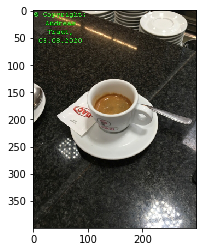

In [28]:
testfolder = '102'
testfile = '9146'
imagenumber = list(feature_dict.keys()).index('..\\data\\caltechown\\' + testfolder + '\\' + testfile + '.jpg')
img = Image.open(list(feature_dict.keys())[imagenumber])
plt.imshow(img)   
plt.savefig('output/' + testfolder + '_' + testfile +  '.png', bbox_inches="tight", pad_inches=0)

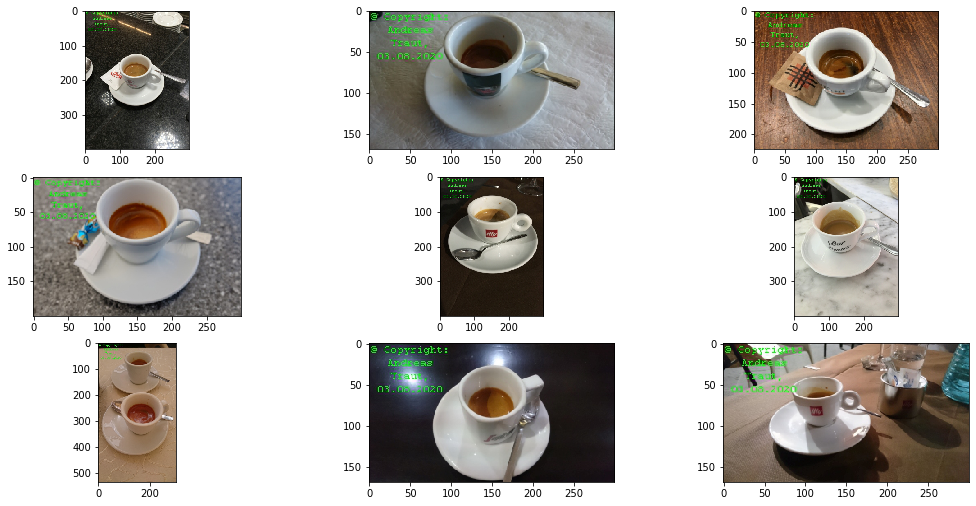

In [29]:
get_similar_item(imagenumber, feature_dict, lsh,testfolder + '_' + testfile + 'similar', 8 )

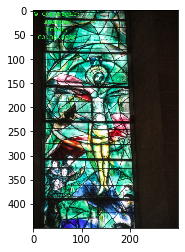

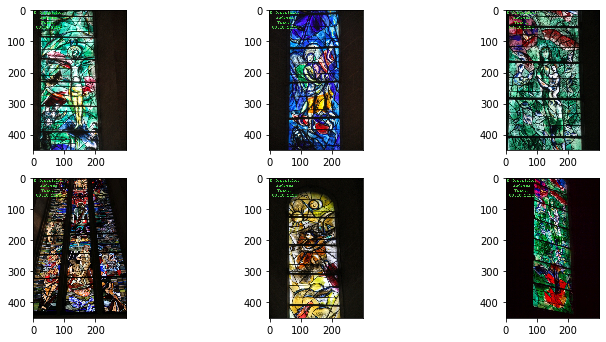

In [14]:
testfolder = '103'
testfile = '9234'
imagenumber = list(feature_dict.keys()).index('..\\data\\caltechown\\' + testfolder + '\\' + testfile + '.jpg')
img = Image.open(list(feature_dict.keys())[imagenumber])
plt.imshow(img)   
plt.savefig('output/' + testfolder + '_' + testfile +  '.png', bbox_inches="tight", pad_inches=0)
get_similar_item(imagenumber, feature_dict, lsh,testfolder + '_' + testfile + 'similar', 5)

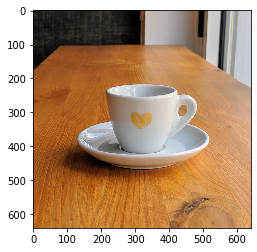

In [15]:
testpicture = '1'
path = '..\\data\\testpictures\\' + testpicture + '.jpg'
img = Image.open(path)
plt.imshow(img)
plt.savefig('output/testpicture_' + testpicture + '.png', bbox_inches="tight", pad_inches=0)

C:\Users\andre\Anaconda3\lib\site-packages\torch\nn\functional.py:3000: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and uses scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


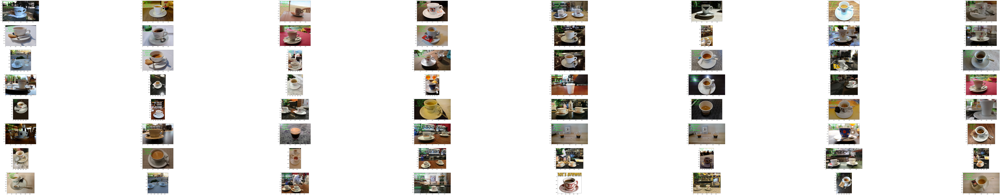

In [21]:
_ = learner.predict(open_image(path))
vect = sf.features[-1]
get_similar_item_vect(vect, feature_dict, lsh, 'testpicture_' + testpicture + 'similar63', 63)

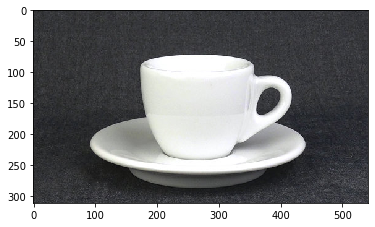

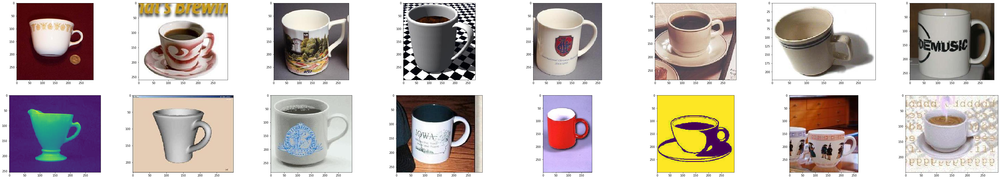

In [23]:
testpicture = '2'
path = '..\\data\\testpictures\\' + testpicture + '.jpg'
img = Image.open(path)
plt.imshow(img)
plt.savefig('output/testpicture_' + testpicture + '.png', bbox_inches="tight", pad_inches=0)
_ = learner.predict(open_image(path))
vect = sf.features[-1]
get_similar_item_vect(vect, feature_dict, lsh, 'testpicture_' + testpicture + 'similar15', 15)

C:\Users\andre\Anaconda3\lib\site-packages\torch\nn\functional.py:3000: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and uses scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor changed "


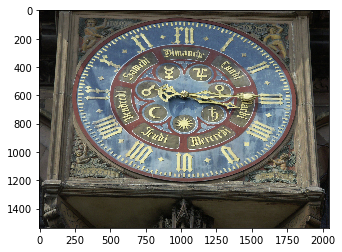

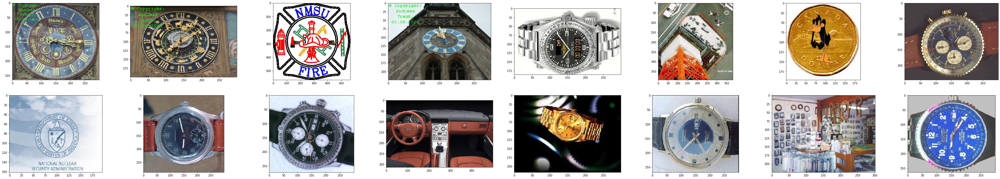

In [52]:
testpicture = '3'
path = '..\\data\\testpictures\\' + testpicture + '.jpg'
img = Image.open(path)
plt.imshow(img)
plt.savefig('output/testpicture_' + testpicture + '.png', bbox_inches="tight", pad_inches=0)
_ = learner.predict(open_image(path))
vect = sf.features[-1]
get_similar_item_vect(vect, feature_dict, lsh, 'testpicture_' + testpicture + 'similar15', 15)